2_galaxy_based_catalog.ipynb : Produce a galaxy based catalog of SN for injection. All the fonctions useful for the injection are now stored in the script injection.py

- Example of use of the injection.py script

- Catalog for one CCD:
    - setup includes all the function that are needed for the injection (random color generator, per band dataset extractor, calculation of the shape of the galaxy)
    
    - Simple gaussian magnitude : we just start with a proof of concept, with a gaussian magnitude based catalog creation.
    
    - Galaxy identification study : To based our injection on galaxy positionning, we first need to identify them. 
        - To sort them from the other object, we use the extendedness criteria, compute by the lsst pipeline
        - Then using the calculation of the shape of the galaxy, we calculate the size and orientation of the ellipse of the galaxy plotting them with red lines.
    
    - Galaxy correlated catalog creation : Once the galaxies are identified, we generate fake positions magnitude. 
        - Production of a first plot showing the positions of the injection relative to their own galaxies center. Magnitude is sampled from the host galaxy magnitude, or random in case the 
        - in pos_mag_4catalog, we convert the positioning of these injection made relative to their own galaxies, to ra dec position. We also produce 5% of hostless SN, and we create a dataframe for catalog creation. 
        - also the possibility to plot a sub part of the ccd to check the positioning of the injection regarding the center of the galaxy
    
    - Catalaog generation : creates a catalog that possibly includes additional metadata of the host
    
    - Inject the Synthetic Source : test the possibility to inject the source on the notebook directly, but for production it needs to be done using the command line. 
    
    - Inspect the injected sources : produce different plots to compare the non inject and inject to make sure they are produce the right way
    - Test of injection on deep coadd

- Catalog for several exposures : Basically reuse the steps for one ccd but for all of them. Catalog are saved per band pass, to avoid issue when injecting.

- Injection check : few checks once the injection has been made on the commandline. Checking if the injection is made on the right bandpass and only one, on the right ccd and on the right visit.

# Import 

In [17]:
import os
import importlib
import pprint

import matplotlib.pyplot as plt
#%matplotlib widget
%matplotlib inline

import numpy as np
import pandas as pd


import astropy.units as u
from astropy.coordinates import SkyCoord


import lsst.afw.display as afwDisplay
import lsst.geom

import lsst.daf.butler as dafButler

from lsst.analysis.ap import apdb


#from lsst.analysis.ap import legacyApdbUtils as utils
from lsst.analysis.ap import legacyPlotUtils as plac
from lsst.daf.butler import Butler

from astropy.table import Table

from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import LogNorm

import pickle
import scipy.stats as stats

from lsst.geom import Point2D, Box2I, Point2I, Extent2I
from matplotlib.patches import Ellipse
import random
from scipy.stats import norm 
from astropy.table import Table

from lsst.source.injection import CoaddInjectConfig,CoaddInjectTask
# NOTE: For injections into other dataset types, use the following instead:
from lsst.source.injection import ExposureInjectConfig,ExposureInjectTask
from lsst.source.injection import VisitInjectConfig,VisitInjectTask

from astropy.visualization import simple_norm
from astropy.visualization import (MinMaxInterval, SqrtStretch,ZScaleInterval,LinearStretch,
                                   ImageNormalize)


In [18]:

import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')



# injection.py example of use
- Example of use of the injection.py script


In [3]:
from injection import generate_fakes_pos_mag, plot_fakes_pos_tohost, pos_mag_4catalog, zoomed_pos_mag_4catalog, random_hex_color, create_catalog, create_catalog_for_all_ccd, inject_sources

repo = "/sps/lsst/users/rbonnetguerrini/pipelines/rc2_subset/SMALL_HSC/"

ModuleNotFoundError: No module named 'injection'

In [4]:
# Create a new butler with the collection of interest
collection = 'u/rbonnetguerrini/step8'
butler = Butler(repo, collections = collection)
registry = butler.registry

#filter the dataset
datasetRefs = registry.queryDatasets(datasetType='sourceTable',collections=collection)


In [5]:
dataIds = []
for i,ref in enumerate(datasetRefs):
    dataIds.append(ref.dataId.full)
print(len(dataIds))
print(dataIds[0])
ref = dataIds[0]

240
{instrument: 'HSC', detector: 41, visit: 346, band: 'y', physical_filter: 'HSC-Y', visit_system: 0}


682


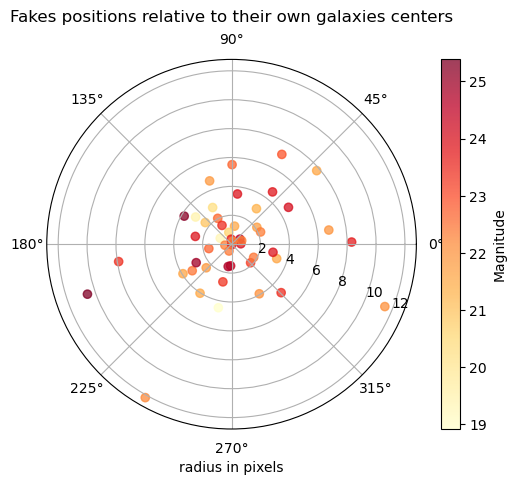

In [14]:
detecs = butler.get('sourceTable', dataId=ref)


filtered_detecs = detecs[detecs['extendedness'] == 1]

# Sample n rows from the filtered DataFrame
print(len(filtered_detecs))
sampled_detecs = filtered_detecs.sample(n=50, random_state=42)

plot_fakes_pos_tohost(sampled_detecs)

In [6]:
detecs = butler.get('sourceTable', dataId=ref)
calexp = butler.get('calexp', dataId=ref)

filtered_detecs = detecs[detecs['extendedness'] == 1]

# Sample n rows from the filtered DataFrame
print(len(filtered_detecs))
sampled_detecs = filtered_detecs.sample(n=50, random_state=42)

ra, dec, mags = pos_mag_4catalog(sampled_detecs, calexp)

682


In [ ]:
zoomed_pos_mag_4catalog(sampled_detecs, calexp, 1200, 1200, 300)

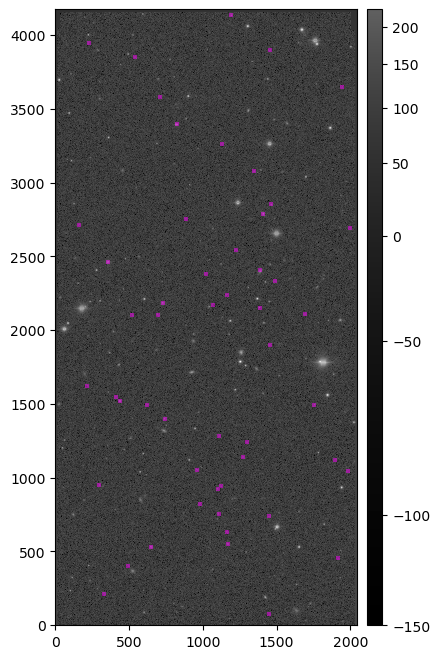

In [7]:
ra, dec, mags, df= pos_mag_4catalog(sampled_detecs, calexp, False, True)

catalog_injection = create_catalog(df)
visit_summary = butler.get("finalVisitSummary",
         dataId=ref,
         collections=collection,).find(ref["detector"])

exp, catalog = inject_sources(calexp, visit_summary, catalog_injection, plot = True)

In [8]:
# Create a new butler with the collection of interest
collection = 'u/rbonnetguerrini/step8'
butler = Butler(repo, collections = collection)
registry = butler.registry

#filter the dataset
datasetRefs = registry.queryDatasets(datasetType='sourceTable',collections=collection)


create_catalog_for_all_ccd(datasetRefs, butler)

{instrument: 'HSC', detector: 41, visit: 346, band: 'y', physical_filter: 'HSC-Y', visit_system: 0}
nbr of galaxy : 682    nbr of injection : 22    percentage of real mag : 100
{instrument: 'HSC', detector: 47, visit: 1242, band: 'i', physical_filter: 'HSC-I', visit_system: 0}
nbr of galaxy : 2011    nbr of injection : 67    percentage of real mag : 100
{instrument: 'HSC', detector: 41, visit: 29350, band: 'g', physical_filter: 'HSC-G', visit_system: 0}
nbr of galaxy : 1478    nbr of injection : 49    percentage of real mag : 100
{instrument: 'HSC', detector: 42, visit: 17948, band: 'z', physical_filter: 'HSC-Z', visit_system: 0}
nbr of galaxy : 3316    nbr of injection : 110    percentage of real mag : 100
{instrument: 'HSC', detector: 41, visit: 17926, band: 'z', physical_filter: 'HSC-Z', visit_system: 0}
nbr of galaxy : 3757    nbr of injection : 125    percentage of real mag : 98
{instrument: 'HSC', detector: 50, visit: 11698, band: 'g', physical_filter: 'HSC-G', visit_system: 0}
n

Reading from location file:///sps/lsst/users/rbonnetguerrini/pipelines/rc2_subset/SMALL_HSC/u/rbonnetguerrini/step1/20240628T092007Z/calexp/20140328/r/HSC-R/1204/calexp_HSC_r_HSC-R_1204_0_14_u_rbonnetguerrini_step1_20240628T092007Z.fits  with formatter lsst.obs.base.formatters.fitsExposure.FitsExposureFormatter: Took 0.6733 seconds


KeyboardInterrupt: 

# Real data access configuration

In [63]:
repo = "/sps/lsst/groups/transients/HSC/fouchez/RC2_repo/butler.yaml"

In [64]:
# Create a new butler with the collection of interest
collection = 'run/ssp_ud_cosmos/step5'
butler = Butler(repo, collections = collection)
registry = butler.registry

#filter the dataset
datasetRefs = registry.queryDatasets(datasetType='sourceTable',collections=collection)


In [21]:
for x in sorted(registry.queryDatasetTypes()):
    x
    #print(x)

In [65]:
dataIds = []
for i,ref in enumerate(datasetRefs):
    dataIds.append(ref.dataId)
print(len(dataIds))
print(dataIds[0])

180100
{instrument: 'HSC', detector: 79, visit: 103752, band: 'i', day_obs: 20170225, physical_filter: 'HSC-I2'}


# Catalog for one CCD
- Catalog for one CCD:
    - setup includes all the function that are needed for the injection (random color generator, per band dataset extractor, calculation of the shape of the galaxy)
    
    - Simple gaussian magnitude : we just start with a proof of concept, with a gaussian magnitude based catalog creation.
    
    - Galaxy identification study : To based our injection on galaxy positionning, we first need to identify them. 
        - To sort them from the other object, we use the extendedness criteria, compute by the lsst pipeline
        - Then using the calculation of the shape of the galaxy, we calculate the size and orientation of the ellipse of the galaxy plotting them with red lines.
    
    - Galaxy correlated catalog creation : Once the galaxies are identified, we generate fake positions magnitude. 
        - Production of a first plot showing the positions of the injection relative to their own galaxies center. Magnitude is sampled from the host galaxy magnitude, or random in case the 
        - in pos_mag_4catalog, we convert the positioning of these injection made relative to their own galaxies, to ra dec position. We also produce 5% of hostless SN, and we create a dataframe for catalog creation. 
        - also the possibility to plot a sub part of the ccd to check the positioning of the injection regarding the center of the galaxy
    
    - Catalaog generation : creates a catalog that possibly includes additional metadata of the host
    
    - Inject the Synthetic Source : test the possibility to inject the source on the notebook directly, but for production it needs to be done using the command line. 
    
    - Inspect the injected sources : produce different plots to compare the non inject and inject to make sure they are produce the right way
    - Test of injection on deep coadd

## Modify injection catalog 

### Setup

In [70]:
def random_hex_color():
    hex_chars = '0123456789ABCDEF'
    color_code = '#' + ''.join(random.choice(hex_chars) for _ in range(6))
    return color_code

In [71]:
def extract_all_filter(band):
    dataIds = []
    result = registry.queryDatasets(datasetType='sourceTable', 
                                    collections=collection,
                                   dataId=band)

    for ref in result:
        dataIds.append(ref.dataId)
        
    return dataIds

In [72]:
def calculate_orientation_and_extent(Ixx, Ixy, Iyy):
    # Calculate position angle (orientation)
    orientation = 0.5 * np.arctan2(2 * Ixy, Ixx - Iyy)
    
    # Calculate eigenvalues of the moment matrix
    term1 = (Ixx + Iyy) / 2
    term2 = np.sqrt(((Ixx - Iyy) / 2) ** 2 + Ixy ** 2)
    lambda1 = term1 + term2
    lambda2 = term1 - term2

    a = np.sqrt(lambda1) 
    b = np.sqrt(lambda2)
    
    return orientation, a, b

In [73]:
# Function to sample from the best distribution of a specific band
def sample_from_distribution(best_fits, band, num_samples=1000):
    if band in best_fits:
        best_distribution = best_fits[band]
        dist_name, params = list(best_distribution.items())[0]  # Get the best distribution name and parameters
        dist = getattr(stats, dist_name)  # Get the distribution object from scipy.stats
        
        # Sample from the distribution
        samples = dist.rvs(*params.values(), size=num_samples)
        return samples
    else:
        print(f"Band {band} not found in best fits.")
        return None

In [74]:
dataIds = []
for i,ref in enumerate(datasetRefs):
    dataIds.append(ref.dataId)
print(len(dataIds))
print(dataIds[0])
ref = dataIds[0]




180100
{instrument: 'HSC', detector: 79, visit: 103752, band: 'i', day_obs: 20170225, physical_filter: 'HSC-I2'}


## Simple gaussian magnitude 

In [21]:
mu = 24.41
std = 1.39

my_injection_catalog = generate_injection_catalog(
    ra_lim=[149.7, 150.1],
    dec_lim=[2.0, 2.4],
    number=5000,
    source_type="Star",
    mag=np.random.normal(mu, std, size=5000)
)

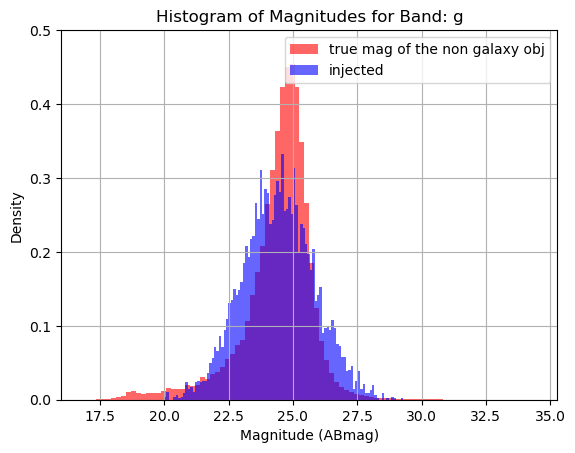

In [22]:
# Visual inspection of the magnitude injection 

filename = f'magnitudes/mag_data_calibFlux.pkl'
    # Load the saved data
with open(filename, 'rb') as f:
    mag_data = pickle.load(f)
magnitudes = mag_data['g']['mag']
plt.hist(magnitudes, bins=100,  density=True, alpha=0.6, color='red', label ='true mag of the non galaxy obj')  
plt.hist(my_injection_catalog['mag'], bins=100, density=True, alpha=0.6, color='blue', label = 'injected')  
plt.title(f'Histogram of Magnitudes for Band: g')
plt.xlabel('Magnitude (ABmag)')
plt.ylabel('Density')
plt.grid(True)
plt.legend()
# Set x-axis limits based on data range
xmin, xmax = np.min(magnitudes), np.max(magnitudes)
plt.xlim([xmin, xmax])

# Set y-axis limits based on histogram density
counts, bin_edges = np.histogram(magnitudes, bins=100, density=True)
ymax = np.max(counts)
plt.ylim([0, ymax * 1.1])
plt.show()


## Galaxy based injection

### Galaxy identification study

In [75]:
# retrieving the galaxies flagged magnitude, 
ref = dataIds[0]


columns = butler.get('sourceTable', dataId = ref).columns
for column in columns: 
    print (column)
detecs = butler.get('sourceTable', dataId=ref)

#visit detector band


coord_ra
coord_dec
visit
detector
parentSourceId
x
y
xErr
yErr
ra
dec
decl
raErr
decErr
ra_dec_Cov
calibFlux
calibFluxErr
ap03Flux
ap03FluxErr
ap03Flux_flag
ap06Flux
ap06FluxErr
ap06Flux_flag
ap09Flux
ap09FluxErr
ap09Flux_flag
ap12Flux
ap12FluxErr
ap12Flux_flag
ap17Flux
ap17FluxErr
ap17Flux_flag
ap25Flux
ap25FluxErr
ap25Flux_flag
ap35Flux
ap35FluxErr
ap35Flux_flag
ap50Flux
ap50FluxErr
ap50Flux_flag
ap70Flux
ap70FluxErr
ap70Flux_flag
sky
skyErr
psfFlux
psfFluxErr
ixx
iyy
ixy
ixxPSF
iyyPSF
ixyPSF
ixxDebiasedPSF
iyyDebiasedPSF
ixyDebiasedPSF
gaussianFlux
gaussianFluxErr
extendedness
sizeExtendedness
localPhotoCalib
localPhotoCalib_flag
localPhotoCalibErr
localWcs_flag
localWcs_CDMatrix_2_1
localWcs_CDMatrix_1_1
localWcs_CDMatrix_1_2
localWcs_CDMatrix_2_2
blendedness_abs
blendedness_flag
blendedness_flag_noCentroid
blendedness_flag_noShape
apFlux_12_0_flag
apFlux_12_0_flag_apertureTruncated
apFlux_12_0_flag_sincCoeffsTruncated
apFlux_12_0_instFlux
apFlux_12_0_instFluxErr
apFlux_17_0_flag
a

In [29]:
#1D2326

In [30]:
import qbstyles

In [76]:
from qbstyles import mpl_style
 
mpl_style(True)
     

In [77]:
print(qbstyles.__file__)


/pbs/home/r/rbonnetguerrini/.local/lib/python3.11/site-packages/qbstyles/__init__.py


In [78]:
# Define the custom style dictionary with transparent colors
custom_style = {
    # Background color
    'axes.facecolor': '#3d3d3c',  # Inner plot background color
    'figure.facecolor': '#3d3d3c',  # Figure background color

    # Text settings with transparency (alpha = 0.75)
    'text.color': '#C2C2C3',  # White with 75% opacity (hex + alpha)
    'axes.labelcolor': '#C2C2C3',  # Axis labels color
    'xtick.color': '#C2C2C3',  # X-axis tick label color
    'ytick.color': '#C2C2C3',  # Y-axis tick label color
    'axes.titlecolor': '#C2C2C3',  # Title color

    # Grid settings with transparency
    'grid.color': '#C2C2C3',  # Grid color with transparency
    'grid.linewidth': 0.5,  # Grid line width

    # Spines (borders of the plot)
    'axes.edgecolor': '#C2C2C3',  # Outer border color (spine) with transparency

    # Scatter plot marker size and edge
    'scatter.marker': 'o',  # Default marker shape
    'scatter.edgecolors': 'none',  # Default marker edges
}


# Save this as a .mplstyle file
import matplotlib.pyplot as plt
plt.style.use(custom_style)  # Activate custom style


In [79]:
col = ['sizeExtendedness','extendedness']

extd = detecs[col]


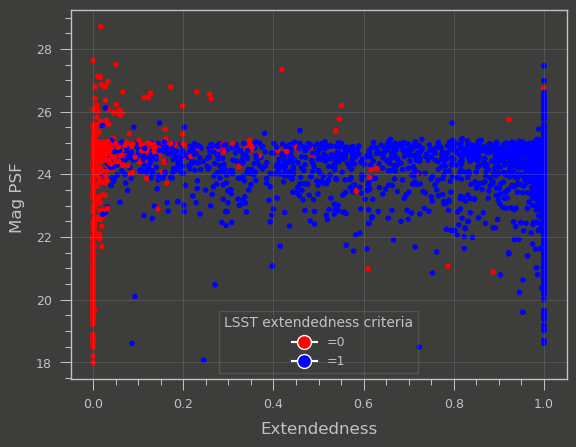

In [80]:


col = ['sizeExtendedness','extendedness']

extd = detecs[col]
colors = extd['extendedness'].apply(lambda x: 'red' if x < 1 else 'blue')

psf = np.array(detecs['psfFlux'])
mag_psf = (psf*u.nJy).to(u.ABmag)
plt.scatter(extd['sizeExtendedness'], mag_psf, c = colors)
plt.xlabel('Extendedness')
plt.ylabel('Mag PSF ')
plt.legend(handles=[plt.Line2D([0], [0], marker='o', color='w', label='=0', markersize=10, markerfacecolor='red'),
                    plt.Line2D([0], [0], marker='o', color='w', label='=1', markersize=10, markerfacecolor='blue')],
           title='LSST extendedness criteria')
plt.grid(True)

#plt.savefig('img_content/extendedness.png')
plt.show()


In [81]:
col_galaxies = ['sizeExtendedness','extendedness','ixx','iyy','ixy',]
extd = detecs[col_galaxies]
extd_galaxy = extd[extd['extendedness'] == 1.0]
extd_galaxy

,sizeExtendedness,extendedness,ixx,iyy,ixy
sourceId,,,,,
44561314340667403,0.765093,1.0,3.351180,4.436901,0.370672
44561314340667406,0.937360,1.0,4.666458,4.552348,-0.441004
44561314340667409,0.008923,1.0,2.445601,2.211428,0.096960
44561314340667410,0.110491,1.0,3.833018,1.526023,0.698034
44561314340667415,0.765108,1.0,4.603921,3.296629,1.834585
...,...,...,...,...,...
44561314340670892,0.999377,1.0,6.121521,5.494787,-1.549993
44561314340670894,0.661708,1.0,3.934488,2.949227,1.205425
44561314340670896,0.956344,1.0,4.351783,4.579393,0.441246


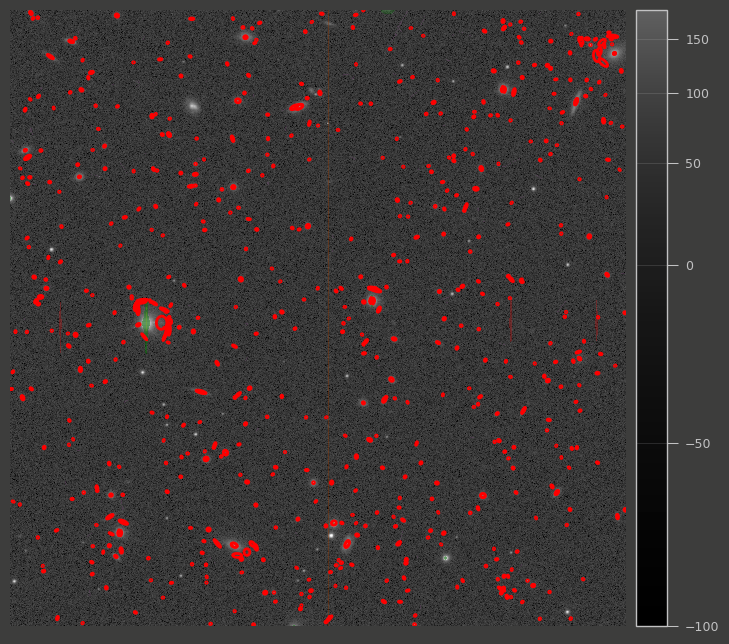

In [83]:

# retrieving the galaxies flagged magnitude, 

detecs = butler.get('sourceTable', dataId=ref)
calexp = butler.get('calexp',dataId=ref)



# Define the region of interest (ROI)
x_center = 1000  # Center x-coordinate
y_center = 2000  # Center y-coordinate
half_size = 700  # Half-size of the region to be plotted

bbox = Box2I(Point2I(x_center - half_size, y_center - half_size),
             Extent2I(2 * half_size, 2 * half_size))
subimage = calexp.Factory(calexp, bbox)


# Set up the display
afwDisplay.setDefaultBackend('matplotlib')
fig = plt.figure(figsize=(10, 8))
afw_display = afwDisplay.Display(1)
afw_display.setMaskTransparency(100, 'DETECTED')
afw_display.setMaskTransparency(100, 'STREAK')

#afw_display.setMaskTransparency(100)
afw_display.scale('asinh', 'zscale')
afw_display.mtv(subimage)

# Plot elliptical apertures on each galaxy
with afw_display.Buffering():
    for index, detec in detecs.iterrows():
        if detec['extendedness'] == 1:
            # Extract the necessary columns
            ixx = detec['ixx']
            iyy = detec['iyy']
            ixy = detec['ixy']
            x = detec['x']
            y = detec['y']
            
            if (x_center - half_size < x < x_center + half_size) and (y_center - half_size < y < y_center + half_size):
                position = Point2D(x, y)
                theta, a, b = calculate_orientation_and_extent(ixx, ixy, iyy)

                # Create and plot the elliptical aperture
                ellipse = Ellipse((position.getX(), position.getY()),
                                  width=2*a, height=2*b, angle=np.degrees(theta),
                                  edgecolor='red', facecolor='none', linewidth=2)
                plt.gca().add_patch(ellipse)
plt.gca().set_axis_off()

# Show the plot with apertures
#plt.savefig('img_content/galaxy_identification.png')
plt.show()


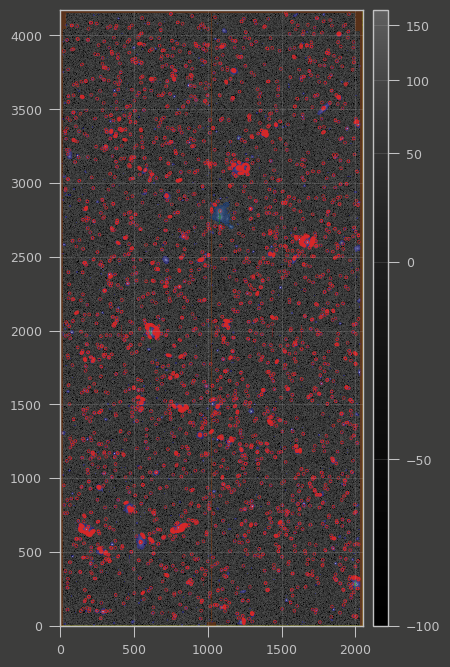

In [ ]:


calexp = butler.get('calexp', dataId=ref)

# Set up the display
afwDisplay.setDefaultBackend('matplotlib')
fig = plt.figure(figsize=(10, 8))
afw_display = afwDisplay.Display(1)
afw_display.scale('asinh', 'zscale')
afw_display.mtv(calexp)


# Plot elliptical apertures on each galaxy
with afw_display.Buffering():
    count = 0
    for index, detec in detecs.iterrows():
        if detec['extendedness'] == 1:
            count = count + 1
            # Extract the necessary columns
            ixx = detec['ixx']
            iyy = detec['iyy']
            ixy = detec['ixy']
            position = Point2D(detec['x'], detec['y'])  
            theta, a, b = calculate_orientation_and_extent(ixx, ixy, iyy)

            # Create and plot the elliptical aperture
            ellipse = Ellipse((position.getX(), position.getY()), width=2*a, height=2*b, angle=np.degrees(theta),
                              edgecolor='#d62728', facecolor='none', linewidth=2)  # Adjust linewidth as needed
            plt.gca().add_patch(ellipse)

# Show the plot with apertures
plt.show()

### Galaxy correlated catalog creation

In [85]:
def sample_from_distribution(band, num_samples=1):
    with open(f'saved/mag_distrib.pkl', "rb") as pickle_file:
        mag_distrib = pickle.load(pickle_file)
    if band in mag_distrib:
        best_distribution = mag_distrib[band]
        dist_name, params = list(best_distribution.items())[0]  # Get the best distribution name and parameters
        dist = getattr(stats, dist_name)  # Get the distribution object from scipy.stats
        
        # Sample from the distribution
        samples = dist.rvs(*params.values(), size=num_samples)
        return samples
    else:
        print(f"Band {band} not found in best fits.")
        return None

In [86]:
sample_from_distribution('N921')[0]

22.299015348562527

In [87]:
def generate_fakes_pos_mag(single_detec, band): 
    orientation, a, b = calculate_orientation_and_extent(single_detec['ixx'], single_detec['ixy'], single_detec['iyy'])
    
    r = np.random.normal(0, a, size=1)
    theta = random.uniform(0, 180)
    
    
    flux_type = 'calibFlux'   # can be change 
    
    flux = (np.array(single_detec[flux_type]))
    mag = (flux * u.nJy).to(u.ABmag)

    if np.isfinite(mag.value): 
        mag  = random.uniform(mag.value -1, mag.value + 3)
    else: 
        mag = sample_from_distribution(band)[0]
    
    return r, theta, mag, orientation



In [88]:
def plot_fakes_pos_tohost(catalog_of_galaxies, band): 
    rads = []
    thetas = []
    thetas4plot = []
    mags = []

    for index, detec in catalog_of_galaxies.iterrows():
        r, theta, mag, orientation = generate_fakes_pos_mag(detec, band)

        rads.append(r)

        if r<0: 
            thetas4plot.append(theta+180)

        else : 
            thetas4plot.append(theta)
        mags.append(mag)


    fig, ax = plt.subplots(subplot_kw={'projection': 'polar'})

    sc = ax.scatter(thetas4plot, np.abs(rads), c=np.array(mags), cmap='YlOrRd', alpha=0.75)
    ax.set_rlabel_position(-22.5)  # Move radial labels away from plotted line
    ax.grid(True)
    cbar = fig.colorbar(sc, ax=ax, label='Magnitude')
    ax.set_title("Fakes positions relative to their own galaxies centers", va='bottom')
    ax.set_xlabel('radius in pixels')

    #plt.savefig('img_content/injections_positions_mag.png')
    plt.show()

2390


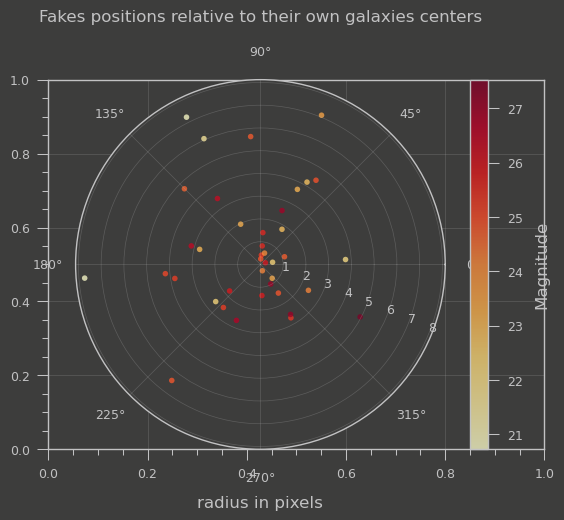

In [89]:
detecs = butler.get('sourceTable', dataId=ref)


filtered_detecs = detecs[detecs['extendedness'] == 1]

# Sample n rows from the filtered DataFrame
print(len(filtered_detecs))
sampled_detecs = filtered_detecs.sample(n=40, random_state=42)

plot_fakes_pos_tohost(sampled_detecs, 'g')

In [90]:
def pos_mag_4catalog(catalog_of_galaxies, image, band, plot = False, additional_host_data = False): 
    inject_ra = []
    inject_dec = []
    new_positions = []
    new_rand_positions = []
    mags = []
    host_data = pd.DataFrame()
    flux_type = 'calibFlux'   # can be change 

    # Retrieve sky origin and pixel origin from wcs
    wcs = image.getWcs()

    sky_origin = wcs.pixelToSky(Point2D(0, 0))  # Convert origin pixel to sky coordinates

    sky_origin_ra = sky_origin.getRa().asDegrees()
    sky_origin_dec = sky_origin.getDec().asDegrees()

    pixel_origin_x = wcs.getPixelOrigin().getX()
    pixel_origin_y = wcs.getPixelOrigin().getY()

    pixel_scale = wcs.getPixelScale().asArcseconds()

    
    for index, detec in catalog_of_galaxies.iterrows():
        r, theta, mag, orientation = generate_fakes_pos_mag(detec, band)
        mags.append(mag)
        
    
         # Convert radial positions to RaDec
        ra = detec['ra']
        dec = detec['dec']
    
        ## Convert polar coordinates (r, theta) to Cartesian coordinates (x, y)
        x = r * np.cos(np.radians(theta))
        y = r * np.sin(np.radians(theta))

        x_rot = x * np.cos(orientation) - y * np.sin(orientation)
        y_rot = x * np.sin(orientation) + y * np.cos(orientation)

        delta_ra = (x_rot/np.cos(np.radians(dec)))*0.168432/3600
        delta_dec = y_rot*0.168432/3600

        ra_i = ra - delta_ra
        dec_i = dec - delta_dec

        inject_ra.append(float(ra_i))
        inject_dec.append(float(dec_i))
        new_positions.append((ra_i, dec_i, ra, dec))
        
        
        if additional_host_data == True:    
            flux = (np.array(detec[flux_type]))
            host_mag = (flux * u.nJy).to(u.ABmag)
            single_host_data = pd.DataFrame({"ra" : ra_i, 
                                            "dec" : dec_i, 
                                            "mag" : mag, 
                                            "host_magnitude" : host_mag, 
                                            "visit" : detec['visit'], 
                                            "detector" : detec['detector'], 
                                            "parent_index" : index, 
                                            "band" : detec['band']
                                            })
            
            host_data = pd.concat([host_data, single_host_data], ignore_index=True)
        
        
    nbr_hostless = len(catalog_of_galaxies)//20    
    mag_hostless = [sample_from_distribution(band)[0] for i in range(nbr_hostless)]
    mags.extend(mag_hostless)
    x = np.random.uniform(0, 2100 , size = nbr_hostless)
    y = np.random.uniform(0, 4200, size = nbr_hostless)

    ra, dec = image.wcs.pixelToSkyArray(x,y, degrees = True)

    inject_ra.extend(list(ra))
    inject_dec.extend(list(dec))
    
                                            
    
    
    if additional_host_data == True:    
        single_host_data = pd.DataFrame({"ra" : list(ra), 
                                            "dec" : list(dec), 
                                            "mag" : mag_hostless, 
                                            "host_magnitude": [None] * len(ra),  # Defaulting to None
                                            "visit" : detec['visit'], 
                                            "detector" : detec['detector'], 
                                            "parent_index": [None] * len(ra),  # Defaulting to None
                                            "band" : detec['band']
                                            })        
        
        host_data = pd.concat([host_data, single_host_data], ignore_index=True)

    new_rand_positions = [ (r, d, xx, yy)  for r, d, xx, yy in zip(ra, dec, x, y)]


    if plot == True : 

        # Set up the display
        afwDisplay.setDefaultBackend('matplotlib')
        fig = plt.figure(figsize=(10, 8))
        afw_display = afwDisplay.Display(1)
        afw_display.scale('asinh', 'zscale')
        afw_display.mtv(image)

        print(wcs)
        # Plot elliptical apertures on each galaxy
        with afw_display.Buffering():
            for index, detec in catalog_of_galaxies.iterrows():
                if detec['extendedness'] == 1:
                    # Extract the necessary columns
                    ixx = detec['ixx']
                    iyy = detec['iyy']
                    ixy = detec['ixy']
                    position = Point2D(detec['x'], detec['y'])  
                    theta, a, b = calculate_orientation_and_extent(ixx, ixy, iyy)

                    # Create and plot the elliptical aperture
                    ellipse = Ellipse((position.getX(), position.getY()), width=2*a, height=2*b, angle=np.degrees(theta), edgecolor='#d62728', facecolor='none', linewidth=2)
                    plt.gca().add_patch(ellipse)

        with afw_display.Buffering():
            for index, (ra_i, dec_i, host_ra, host_dec) in enumerate(new_positions):
                color = random_hex_color()
                pixel_pos = wcs.skyToPixel(lsst.geom.SpherePoint(ra_i, dec_i, lsst.geom.degrees))
                afw_display.dot('x', pixel_pos.getX(), pixel_pos.getY(), size=100, ctype=color)
                
                center_pos = wcs.skyToPixel(lsst.geom.SpherePoint(host_ra, host_dec, lsst.geom.degrees))
                afw_display.dot('o', center_pos.getX(), center_pos.getY(), size=100, ctype=color)

        with afw_display.Buffering():
            for ra_i, dec_i, x, y  in new_rand_positions:
                color = random_hex_color()
                afw_display.dot('*', x, y, size=100, ctype=color)
        #plt.savefig('img_content/injections_full_ccd.png')

        plt.show()  
        
    if additional_host_data == True : 
        return inject_ra, inject_dec, mags, host_data

    return inject_ra, inject_dec, mags


2390
FITS standard SkyWcs:
Sky Origin: (150.4764700642, +2.6959339292)
Pixel Origin: (983.949, 2092.16)
Pixel Scale: 0.164504 arcsec/pixel


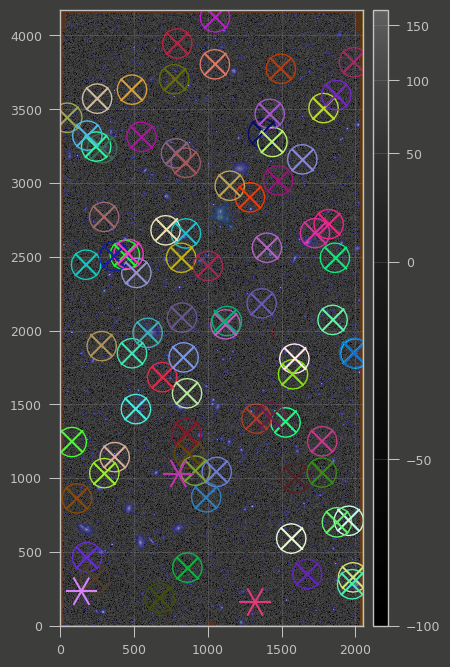

In [94]:
detecs = butler.get('sourceTable', dataId=ref)
calexp = butler.get('calexp', dataId=ref)

filtered_detecs = detecs[detecs['extendedness'] == 1]

# Sample n rows from the filtered DataFrame
print(len(filtered_detecs))
nbr_fake = int(len(filtered_detecs)/30)
sampled_detecs = filtered_detecs.sample(n=nbr_fake, random_state=42)

ra, dec, mags = pos_mag_4catalog(sampled_detecs, calexp, 'g', True, False)

#exp, catalog = inject_sources(calexp, create_catalog(ra, dec, mags), plot = True)


In [95]:
def zoomed_pos_mag_4catalog(catalog_of_galaxies, image,  x_center, y_center, half_size, band): 
    inject_ra = []
    inject_dec = []
    new_positions = []
    mags = []

    for index, detec in catalog_of_galaxies.iterrows():
        r, theta, mag, orientation = generate_fakes_pos_mag(detec, band)

        mags.append(mag)
        
         # Convert radial positions to RaDec
        ra = detec['ra']
        dec = detec['dec']
    
        ## Convert polar coordinates (r, theta) to Cartesian coordinates (x, y)
        x = r * np.cos(np.radians(theta))

        y = r * np.sin(np.radians(theta))

        x_rot = x * np.cos(orientation) - y * np.sin(orientation)

        y_rot = x * np.sin(orientation) + y * np.cos(orientation)

        delta_ra = (x_rot/np.cos(np.radians(dec)))*0.168432/3600

        delta_dec = y_rot*0.168432/3600

        ra_i = ra - delta_ra

        dec_i = dec - delta_dec

        inject_ra.append(ra_i)
        inject_dec.append(dec_i)
        new_positions.append((ra_i, dec_i, ra, dec))

    bbox = Box2I(Point2I(x_center-half_size, y_center-half_size),
             Extent2I(2 * half_size, 2 * half_size))
    subimage = image.Factory(image, bbox)
    
    
    nbr_hostless = len(catalog_of_galaxies)//20    
    mag_hostless = [random.uniform(17, 23) for i in range(nbr_hostless)]
    mags.extend(mag_hostless)
    x = np.random.uniform(0, 2100 , size = nbr_hostless)
    y = np.random.uniform(0, 4200, size = nbr_hostless)

    ra, dec = image.wcs.pixelToSkyArray(x,y, degrees = True)

    inject_ra.extend(list(ra))
    inject_dec.extend(list(dec))
    new_rand_positions = [ (r, d, xx, yy)  for r, d, xx, yy in zip(ra, dec, x, y)]
    # Set up the display
    afwDisplay.setDefaultBackend('matplotlib')
    fig = plt.figure(figsize=(10, 8))
    afw_display = afwDisplay.Display(1)
    afw_display.setMaskTransparency(100, 'DETECTED')
    afw_display.setMaskTransparency(100, 'STREAK')

    #afw_display.setMaskTransparency(100)
    afw_display.scale('asinh', 'zscale')
    afw_display.mtv(subimage)
    wcs = subimage.getWcs()
    print(wcs)
    # Plot elliptical apertures on each galaxy
    with afw_display.Buffering():
        for index, detec in catalog_of_galaxies.iterrows():
            if detec['extendedness'] == 1:
                # Extract the necessary columns
                ixx = detec['ixx']
                iyy = detec['iyy']
                ixy = detec['ixy']
                x = detec['x']
                y = detec['y']

                if (x_center - half_size < x < x_center + half_size) and (y_center - half_size < y < y_center + half_size):
                    position = Point2D(x, y)
                    theta, a, b = calculate_orientation_and_extent(ixx, ixy, iyy)

                    # Create and plot the elliptical aperture
                    ellipse = Ellipse((position.getX(), position.getY()),
                                      width= a, height=b, angle=np.degrees(theta),
                                      edgecolor='red', facecolor='none', linewidth=2)
                    plt.gca().add_patch(ellipse)

    with afw_display.Buffering():
        for index, (ra_i, dec_i, host_ra, host_dec) in enumerate(new_positions):
            color = random_hex_color()
            pixel_pos = wcs.skyToPixel(lsst.geom.SpherePoint(ra_i, dec_i, lsst.geom.degrees))
            if (x_center - half_size < pixel_pos.getX() < x_center + half_size) and (y_center - half_size < pixel_pos.getY() < y_center + half_size):

                afw_display.dot('x', pixel_pos.getX(), pixel_pos.getY(), size=10, ctype=color)

                # Draw line connecting cross to the center of the ellipse
                center_pos = wcs.skyToPixel(lsst.geom.SpherePoint(host_ra, host_dec, lsst.geom.degrees))
                afw_display.dot('o', center_pos.getX(), center_pos.getY(), size=10, ctype=color)
    
    
    with afw_display.Buffering():
        for ra_i, dec_i, x, y  in new_rand_positions:
            if (x_center - half_size < x < x_center + half_size) and (y_center - half_size < y < y_center + half_size):
                color = random_hex_color()
                afw_display.dot('*', x, y, size=10, ctype=color)

    #plt.savefig('img_content/injections_zoomed_ccd.png')
    plt.show()
    

FITS standard SkyWcs:
Sky Origin: (150.4764700642, +2.6959339292)
Pixel Origin: (983.949, 2092.16)
Pixel Scale: 0.164504 arcsec/pixel


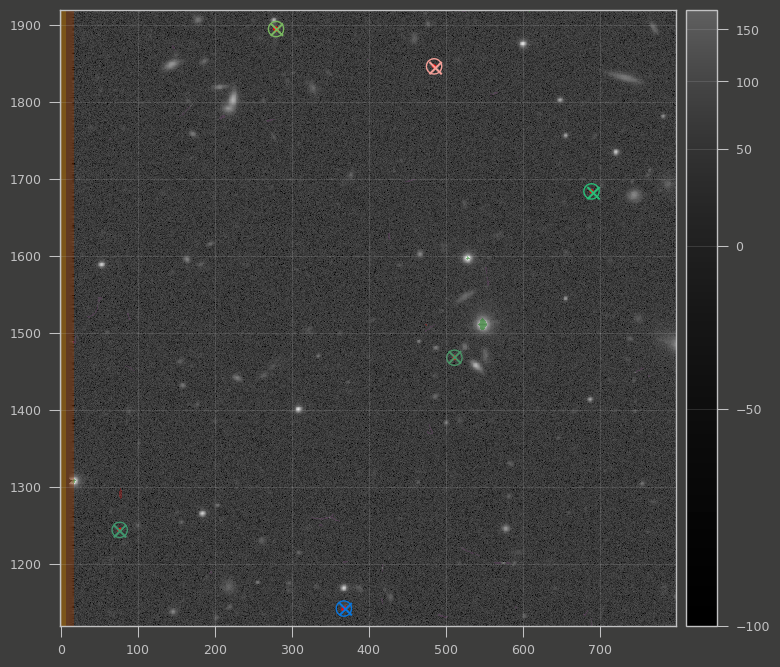

In [101]:
zoomed_pos_mag_4catalog(sampled_detecs, calexp, 400, 1520, 400, 'y')

### Catalog generation

In [134]:
#from injection import generate_fakes_pos_mag, plot_fakes_pos_tohost, pos_mag_4catalog, zoomed_pos_mag_4catalog, random_hex_color

repo = "/sps/lsst/users/rbonnetguerrini/pipelines/rc2_subset/SMALL_HSC/"

# Create a new butler with the collection of interest
collection = 'u/rbonnetguerrini/step8'
butler = Butler(repo, collections = collection)
registry = butler.registry

#filter the dataset
datasetRefs = registry.queryDatasets(datasetType='sourceTable',collections=collection)


dataIds = []
for i,ref in enumerate(datasetRefs):
    dataIds.append(ref.dataId)
print(len(dataIds))
print(dataIds[0])
ref = dataIds[0]

detecs = butler.get('sourceTable', dataId=ref)
calexp = butler.get('calexp', dataId=ref)

filtered_detecs = detecs[detecs['extendedness'] == 1]

# Sample n rows from the filtered DataFrame
print(len(filtered_detecs))
sampled_detecs = filtered_detecs.sample(n=200, random_state=42) #INJECTING ON A LOT JUST FOR THE PURPOSE OF THE TEST

ra, dec, mags, df = pos_mag_4catalog(sampled_detecs, calexp, 'g', additional_host_data = True)


240
{instrument: 'HSC', detector: 41, visit: 346, band: 'y', day_obs: 20140325, physical_filter: 'HSC-Y'}
682


In [135]:
def create_catalog(dict_data, host_data = False):
    '''
    Creates a catalog from dictionary data, optionally including host galaxy data. The short catalog fits the injection pipeline standard. 

    Parameters:
    dict_data (dict): Dictionary containing 'ra', 'dec', 'mag', and optionally 'host_magnitude', 'visit', 'detector', 'parent_index', 'band'.
    host_data (bool, optional): Flag indicating whether to include host galaxy data. Defaults to False.

    Returns:
    astropy.table.Table: Catalog table containing injection_id, ra, dec, source_type, mag, and optionally host_magnitude, visit, detector, parent_index, band.
    '''
    
    if host_data is False:
        df = pd.DataFrame({ "injection_id" : np.arange(len(dict_data["ra"])), 
                           "ra" : dict_data["ra"], 
                           "dec" : dict_data["dec"],
                           "source_type" : "Star",
                           "mag" : dict_data["mag"]})
        fancy_catalog = Table.from_pandas(df)
        return fancy_catalog
    
    else : 
        df = pd.DataFrame({ "injection_id" : np.arange(len(dict_data["ra"])), 
                           "ra" : dict_data["ra"], 
                           "dec" : dict_data["dec"],
                           "source_type" : "Star",
                           "mag" : dict_data["mag"],
                          "host_magnitude" : dict_data["host_magnitude"],
                          "visit" : dict_data["visit"],
                          "detector" : dict_data["detector"],
                          "parent_index" : dict_data["parent_index"],
                          "band" : dict_data["band"],
                          })
        fancy_catalog = Table.from_pandas(df)
        return fancy_catalog


fancy_catalog = create_catalog(df)
fancy_catalog

injection_id,ra,dec,source_type,mag
int64,float64,float64,str4,float64
0,150.31091874894452,2.1504533363692717,Star,21.299812297028065
1,150.3604869100746,2.0905642176953116,Star,24.9965416944118
2,150.3393416597657,2.1007676617731663,Star,24.600740991918705
3,150.37080887374614,2.136954901568064,Star,22.64363889386819
4,150.30852698843887,2.1181022939697156,Star,21.28850329641858
5,150.2833620686507,2.089277310375988,Star,23.70287510304535
6,150.29054052945358,2.125362243850541,Star,22.45201274636588
7,150.35687081731226,2.094585555439462,Star,23.720919474698906
8,150.2941648899092,2.1661809248805755,Star,21.505544424434774


## Inject the Synthetic sources

In [136]:
input_exposure = calexp
visit_summary = butler.get(
     "finalVisitSummary",
     dataId=ref,
     collections=collection,
 )

# NOTE: Visit-level injections should instead use the visit summary table.
detector_summary = visit_summary.find(ref["detector"])
psf = detector_summary.getPsf()
photo_calib = detector_summary.getPhotoCalib()
wcs = detector_summary.getWcs()


# Instantiate the injection classes.
inject_config = VisitInjectConfig(process_all_data_ids  = False)
inject_task = VisitInjectTask(config=inject_config)

# Run the source injection task.
injected_output = inject_task.run(
    injection_catalogs = fancy_catalog,
    input_exposure = input_exposure.clone(),
    psf = psf,
    photo_calib = photo_calib,
    wcs = wcs,
)
injected_exposure=injected_output.output_exposure
injected_catalog=injected_output.output_catalog

In [137]:
def inject_sources(input_exp, visit_summary, catalog_of_injection, plot = False):
    '''
    Injects sources into an input exposure using the provided catalog of injection sources and visit summary data.

    Parameters:
    -----------
    input_exp : Exposure
        The input exposure where sources will be injected.
    visit_summary : VisitSummary
        Summary of the visit, containing detector-specific information like PSF, photometric calibration, and WCS. Obtained running 
        visit_summary = butler.get("finalVisitSummary", dataId=ref, collections=collection,).find(ref["detector"])
    catalog_of_injection : dict
        Catalog of sources to be injected, typically containing positions, magnitudes, etc.
    plot : bool, optional
        If True, displays a plot of the injected sources on the exposure (default is False).

    Returns:
    --------
    tuple
        A tuple containing the injected exposure and the catalog of injected sources.
        - injected_exposure (Exposure): The exposure object after sources have been injected.
        - injected_catalog (Catalog): The catalog of injected sources with updated properties.
    '''   
    input_exposure = input_exp
  

    # NOTE: Visit-level injections should instead use the visit summary table.
    detector_summary = visit_summary.find(ref["detector"])
    psf = detector_summary.getPsf()
    photo_calib = detector_summary.getPhotoCalib()
    wcs = detector_summary.getWcs()


    # Instantiate the injection classes.
    inject_config = VisitInjectConfig(process_all_data_ids  = False)
    inject_task = VisitInjectTask(config=inject_config)

    # Run the source injection task.
    injected_output = inject_task.run(
        injection_catalogs = catalog_of_injection,
        input_exposure = input_exposure.clone(),
        psf = psf,
        photo_calib = photo_calib,
        wcs = wcs,
    )
    
    injected_exposure=injected_output.output_exposure
    injected_catalog=injected_output.output_catalog
    
    if (plot == True) : 
        afwDisplay.setDefaultBackend('matplotlib')
        fig = plt.figure(figsize=(10, 8))
        afw_display = afwDisplay.Display(1)
        afw_display.setMaskTransparency(100)
        afw_display.setMaskTransparency(50, name="INJECTED")
        afw_display.scale('asinh', 'zscale')
        afw_display.mtv(injected_exposure)
        plt.show()
    
    return injected_exposure, injected_catalog


In [138]:
ra, dec, mags, df = pos_mag_4catalog(sampled_detecs, calexp,'g', False, True)

catalog_injection = create_catalog(df, host_data=True)
visit_summary = butler.get("finalVisitSummary",
         dataId=ref,
         collections=collection,)


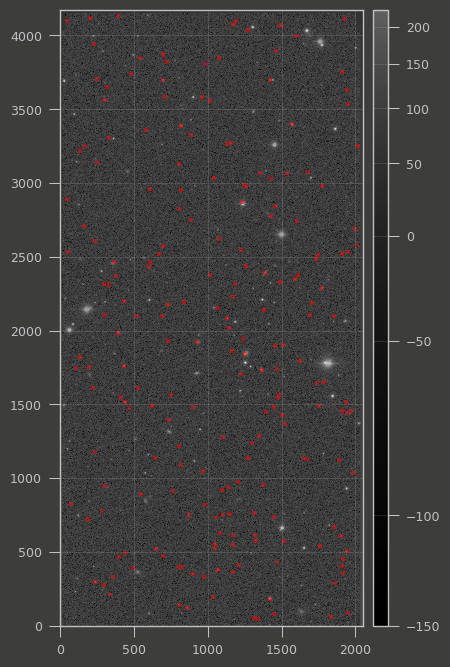

In [139]:
exp, catalog = inject_sources(calexp, visit_summary, catalog_injection, plot = True)

In [140]:
print('t')

t


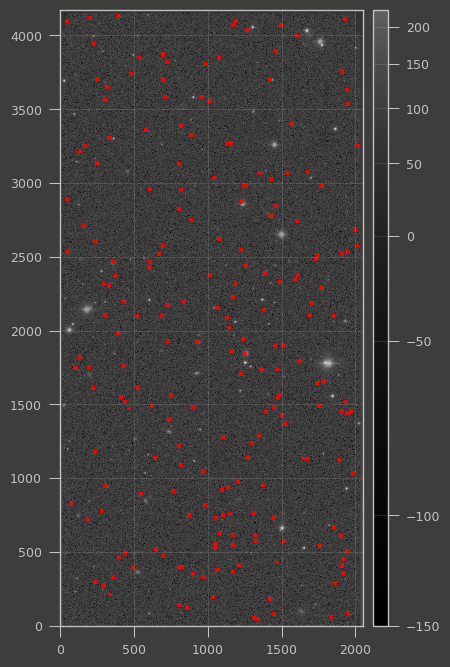

In [141]:
afwDisplay.setDefaultBackend('matplotlib')
fig = plt.figure(figsize=(10, 8))
afw_display = afwDisplay.Display(1)
afw_display.setMaskTransparency(100)
afw_display.setMaskTransparency(10, name="INJECTED")
afw_display.scale('asinh', 'zscale')
afw_display.mtv(exp)

## Inspect the injected sources

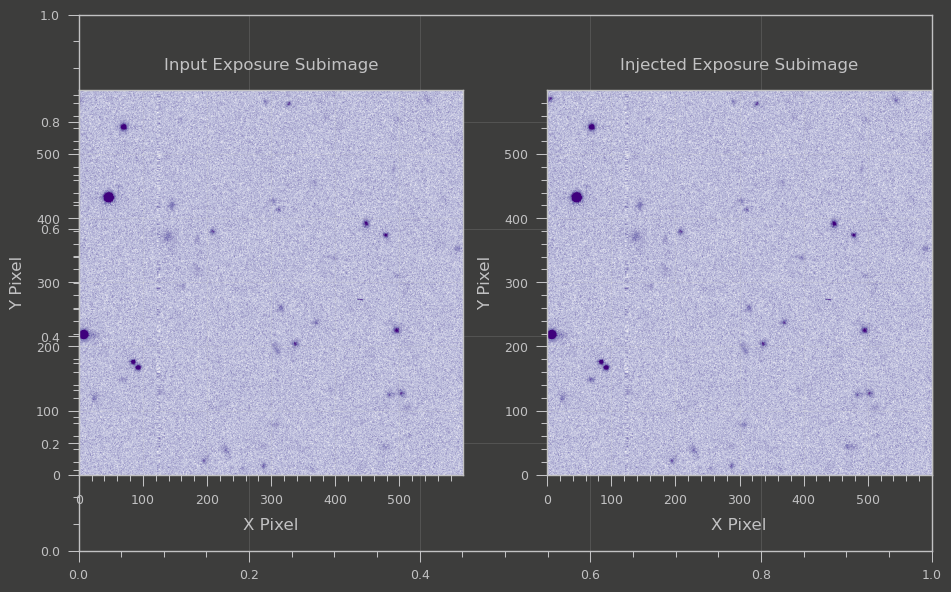

FITS standard SkyWcs:
Sky Origin: (150.3151952688, +2.1389936177)
Pixel Origin: (934.001, 2008.94)
Pixel Scale: 0.168472 arcsec/pixel


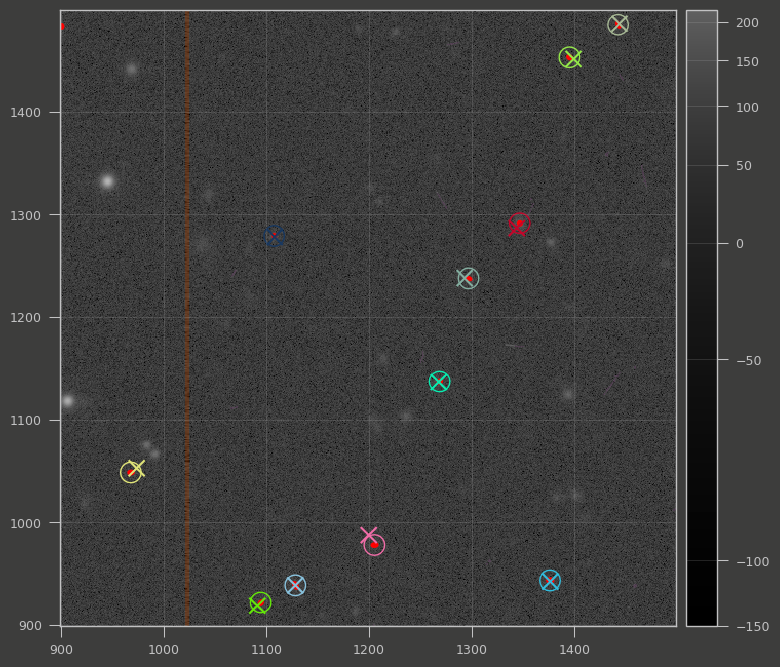

In [142]:
import matplotlib.pyplot as plt
from astropy.visualization import ZScaleInterval, ImageNormalize, LinearStretch

# Define the interval for normalization
interval = ZScaleInterval()

# Get limits and normalization for the first image
vmin1, vmax1 = interval.get_limits(input_exposure.image.array)
norm1 = ImageNormalize(vmin=vmin1, vmax=vmax1, stretch=LinearStretch())

# Define the center and half size for the bounding box
x_center = 1200
y_center = 1200
half_size = 300

# Create bounding box
bbox = Box2I(Point2I(x_center-half_size, y_center-half_size),
             Extent2I(2 * half_size, 2 * half_size))

# Extract subimage for the first image
subimage1 = input_exposure.Factory(input_exposure, bbox)
image_array1 = subimage1.image.array

# Get limits and normalization for the second image
vmin2, vmax2 = interval.get_limits(injected_exposure.image.array)
norm2 = ImageNormalize(vmin=vmin2, vmax=vmax2, stretch=LinearStretch())

# Extract subimage for the second image
subimage2 = injected_exposure.Factory(injected_exposure, bbox)
image_array2 = subimage2.image.array

# Set up the display using imshow for both images in the same figure
fig, axes = plt.subplots(1, 2, figsize=(10,6))

# First image
im1 = axes[0].imshow(image_array1, origin='lower', norm=norm1, cmap='Purples')
axes[0].set_xlabel('X Pixel')
axes[0].set_ylabel('Y Pixel')
axes[0].set_title('Input Exposure Subimage')

# Second image
im2 = axes[1].imshow(image_array2, origin='lower', norm=norm2, cmap='Purples')
axes[1].set_xlabel('X Pixel')
axes[1].set_ylabel('Y Pixel')
axes[1].set_title('Injected Exposure Subimage')

plt.tight_layout()
plt.show()

zoomed_pos_mag_4catalog(sampled_detecs, calexp, 1200, 1200, 300,'g')

# Catalog for several exposures
- Catalog for several exposures : Basically reuse the steps for one ccd but for all of them. Catalog are saved per band pass, to avoid issue when injecting.


In [147]:
#from injection import generate_fakes_pos_mag, plot_fakes_pos_tohost, pos_mag_4catalog, zoomed_pos_mag_4catalog, random_hex_color

repo = "/sps/lsst/groups/transients/HSC/fouchez/RC2_repo/butler.yaml"
# Create a new butler with the collection of interest
collection = 'run/ssp_ud_cosmos/step5'

butler = Butler(repo, collections = collection)
registry = butler.registry

#filter the dataset
datasetRefs = registry.queryDatasets(datasetType='sourceTable',collections=collection)


all_catalog = pd.DataFrame()

for i,reference in enumerate(datasetRefs):
    ref = reference.dataId

    detecs = butler.get('sourceTable', dataId=ref)
    calexp = butler.get('calexp', dataId=ref)

    filtered_detecs = detecs[detecs['extendedness'] == 1]
    # Sample n rows from the filtered DataFrame    
    nbr_fake = int(len(filtered_detecs)/30)
    
    sampled_detecs = filtered_detecs.sample(n=nbr_fake, random_state=42)
    finite_mag_per = sum(np.isfinite((flux * u.nJy).to(u.ABmag).value) for flux in sampled_detecs['calibFlux'])/len(sampled_detecs)*100
    print(ref)
    print('nbr of galaxy : %d    nbr of injection : %d    percentage of real mag : %d' % (len(filtered_detecs), nbr_fake, finite_mag_per))

    ra, dec, mags, df = pos_mag_4catalog(sampled_detecs, calexp, 'g', False, True)
    
    fancy_catalog = create_catalog(df, True).to_pandas()
    all_catalog = pd.concat([all_catalog, fancy_catalog], ignore_index=True)

print(create_catalog.head())


{instrument: 'HSC', detector: 2, visit: 11706, band: 'g', day_obs: 20141118, physical_filter: 'HSC-G'}
nbr of galaxy : 1313    nbr of injection : 43    percentage of real mag : 97
{instrument: 'HSC', detector: 55, visit: 102210, band: 'y', day_obs: 20170203, physical_filter: 'HSC-Y'}
nbr of galaxy : 784    nbr of injection : 26    percentage of real mag : 100
{instrument: 'HSC', detector: 95, visit: 95078, band: 'z', day_obs: 20170102, physical_filter: 'HSC-Z'}
nbr of galaxy : 962    nbr of injection : 32    percentage of real mag : 96
{instrument: 'HSC', detector: 14, visit: 107902, band: 'g', day_obs: 20170329, physical_filter: 'HSC-G'}
nbr of galaxy : 1365    nbr of injection : 45    percentage of real mag : 100
{instrument: 'HSC', detector: 61, visit: 103736, band: 'i', day_obs: 20170225, physical_filter: 'HSC-I2'}
nbr of galaxy : 455    nbr of injection : 15    percentage of real mag : 100
{instrument: 'HSC', detector: 1, visit: 11738, band: 'y', day_obs: 20141118, physical_filter

Reading from location file:///sps/lsst/groups/transients/HSC/fouchez/RC2_repo/run/ssp_ud_cosmos/step1/20240924T075921Z/calexp/20170130/z/HSC-Z/100852/calexp_HSC_z_HSC-Z_100852_0_13_run_ssp_ud_cosmos_step1_20240924T075921Z.fits  with formatter lsst.obs.base.formatters.fitsExposure.FitsExposureFormatter: Took 0.9732 seconds


KeyboardInterrupt: 

In [148]:

def create_catalog_for_all_ccd(datasetRefs, butler, band, csv = False, save_filename = None):
    all_catalog = pd.DataFrame()

    for i,reference in enumerate(datasetRefs):
        ref = reference.dataId
        if ref['band'] == band : 

            detecs = butler.get('sourceTable', dataId=ref)
            calexp = butler.get('calexp', dataId=ref)

            filtered_detecs = detecs[detecs['extendedness'] == 1]
            # Sample n rows from the filtered DataFrame    
            nbr_fake = int(len(filtered_detecs)/20)

            sampled_detecs = filtered_detecs.sample(n=nbr_fake, random_state=42)
            finite_mag_per = sum(np.isfinite((flux * u.nJy).to(u.ABmag).value) for flux in sampled_detecs['calibFlux'])/len(sampled_detecs)*100
            if finite_mag_per<=0:
                
                print(ref)
                print('nbr of galaxy : %d    nbr of injection : %d    percentage of real mag : %d' % (len(filtered_detecs), nbr_fake, finite_mag_per))
                print('cannot be stored, no flux')
            
            else :
                print(ref)
                print('nbr of galaxy : %d    nbr of injection : %d    percentage of real mag : %d' % (len(filtered_detecs), nbr_fake, finite_mag_per))
                
                ra, dec, mags, df = pos_mag_4catalog(sampled_detecs, calexp, band, False, True)

                fancy_catalog = create_catalog(df, True).to_pandas()
                all_catalog = pd.concat([all_catalog, fancy_catalog], ignore_index=True)

    if csv : 
        all_catalog.to_csv(f'injection_catalog/{save_filename}.csv')


    return create_catalog_for_all_ccd

In [ ]:
create_catalog_for_all_ccd(datasetRefs, butler, 'N921', True, save_filename='N921')


{instrument: 'HSC', detector: 83, visit: 23600, band: 'N921', day_obs: 20150318, physical_filter: 'NB0921'}
nbr of galaxy : 1002    nbr of injection : 50    percentage of real mag : 100
{instrument: 'HSC', detector: 83, visit: 68324, band: 'N921', day_obs: 20160411, physical_filter: 'NB0921'}
nbr of galaxy : 1347    nbr of injection : 67    percentage of real mag : 100
{instrument: 'HSC', detector: 68, visit: 23598, band: 'N921', day_obs: 20150318, physical_filter: 'NB0921'}
nbr of galaxy : 1105    nbr of injection : 55    percentage of real mag : 100
{instrument: 'HSC', detector: 30, visit: 68330, band: 'N921', day_obs: 20160411, physical_filter: 'NB0921'}
nbr of galaxy : 1173    nbr of injection : 58    percentage of real mag : 100
{instrument: 'HSC', detector: 42, visit: 23596, band: 'N921', day_obs: 20150318, physical_filter: 'NB0921'}
nbr of galaxy : 1222    nbr of injection : 61    percentage of real mag : 98
{instrument: 'HSC', detector: 62, visit: 68332, band: 'N921', day_obs: 

In [ ]:
create_catalog_for_all_ccd(datasetRefs, butler, 'g', True, save_filename='test_g')
create_catalog_for_all_ccd(datasetRefs, butler, 'r', True, save_filename='test_r')
create_catalog_for_all_ccd(datasetRefs, butler, 'i', True, save_filename='test_i')
create_catalog_for_all_ccd(datasetRefs, butler, 'z', True, save_filename='test_z')
create_catalog_for_all_ccd(datasetRefs, butler, 'y', True, save_filename='test_y')



{instrument: 'HSC', detector: 41, visit: 29350, band: 'g', physical_filter: 'HSC-G', visit_system: 0}
nbr of galaxy : 1478    nbr of injection : 49    percentage of real mag : 100
{instrument: 'HSC', detector: 50, visit: 11698, band: 'g', physical_filter: 'HSC-G', visit_system: 0}
nbr of galaxy : 2565    nbr of injection : 85    percentage of real mag : 100
{instrument: 'HSC', detector: 47, visit: 11704, band: 'g', physical_filter: 'HSC-G', visit_system: 0}
nbr of galaxy : 1861    nbr of injection : 62    percentage of real mag : 100
{instrument: 'HSC', detector: 47, visit: 29336, band: 'g', physical_filter: 'HSC-G', visit_system: 0}
nbr of galaxy : 1326    nbr of injection : 44    percentage of real mag : 100
{instrument: 'HSC', detector: 50, visit: 11694, band: 'g', physical_filter: 'HSC-G', visit_system: 0}
nbr of galaxy : 2880    nbr of injection : 96    percentage of real mag : 100
{instrument: 'HSC', detector: 41, visit: 11710, band: 'g', physical_filter: 'HSC-G', visit_system: 0

In [2]:
import pandas as pd

In [7]:
g=pd.read_csv('injection_catalog/test_g.csv')
r=pd.read_csv('injection_catalog/test_r.csv')
i=pd.read_csv('injection_catalog/test_i.csv')
z=pd.read_csv('injection_catalog/test_z.csv')
y=pd.read_csv('injection_catalog/test_y.csv')


In [16]:
import pickle
with open("saved/full_dia_source_table.pkl", "rb") as pickle_file:
    full_dia_source_table = pickle.load(pickle_file)

In [15]:
create_catalog_for_all_ccd(datasetRefs, butler, True, 'test')

{instrument: 'HSC', detector: 41, visit: 346, band: 'y', physical_filter: 'HSC-Y', visit_system: 0}
nbr of galaxy : 682    nbr of injection : 22    percentage of real mag : 100
{instrument: 'HSC', detector: 47, visit: 1242, band: 'i', physical_filter: 'HSC-I', visit_system: 0}
nbr of galaxy : 2011    nbr of injection : 67    percentage of real mag : 100
{instrument: 'HSC', detector: 41, visit: 29350, band: 'g', physical_filter: 'HSC-G', visit_system: 0}
nbr of galaxy : 1478    nbr of injection : 49    percentage of real mag : 100
{instrument: 'HSC', detector: 42, visit: 17948, band: 'z', physical_filter: 'HSC-Z', visit_system: 0}
nbr of galaxy : 3316    nbr of injection : 110    percentage of real mag : 100
{instrument: 'HSC', detector: 41, visit: 17926, band: 'z', physical_filter: 'HSC-Z', visit_system: 0}
nbr of galaxy : 3757    nbr of injection : 125    percentage of real mag : 98
{instrument: 'HSC', detector: 50, visit: 11698, band: 'g', physical_filter: 'HSC-G', visit_system: 0}
n

<function __main__.create_catalog_for_all_ccd(datasetRefs, butler, csv=False, save_filename=None)>

In [25]:
all_catalog

,injection_id,ra,dec,source_type,mag,host_magnitude,visit,detector,parent_index,band
0,0,150.310799,150.310799,Star,20.547906,21.509638,346,41,148693915271629,y
1,1,150.360178,150.360178,Star,23.957482,22.305697,346,41,148693915271408,y
2,2,150.339403,150.339403,Star,22.758676,21.617276,346,41,148693915271507,y
3,3,150.370782,150.370782,Star,25.059259,22.864977,346,41,148693915271363,y
4,4,150.308634,150.308634,Star,20.785531,21.614454,346,41,148693915271640,y
...,...,...,...,...,...,...,...,...,...,...
22534,47,150.071233,150.071233,Star,23.540649,23.698627,22632,42,9720460178620825,y
22535,48,150.080491,150.080491,Star,20.407884,20.737933,22632,42,9720460178620889,y
22536,49,150.030443,150.030443,Star,24.477174,22.672749,22632,42,9720460178620506,y
22537,50,150.206459,150.206459,Star,3.000000,NaN,22632,42,NaN,y


# Injection check
few checks once the injection has been made on the commandline. Checking if the injection is made on the right bandpass and only one, on the right ccd and on the right visit.

In [69]:
for x in sorted(registry.queryDatasetTypes()):
    x
    print(x)

DatasetType('AB1_config', {}, Config)
DatasetType('AB1_log', {band, instrument, skymap, tract, patch}, ButlerLogRecords)
DatasetType('AB1_metadata', {band, instrument, skymap, tract, patch}, TaskMetadata)
DatasetType('AD1_design_config', {}, Config)
DatasetType('AD1_design_log', {band, instrument, skymap, tract}, ButlerLogRecords)
DatasetType('AD1_design_metadata', {band, instrument, skymap, tract}, TaskMetadata)
DatasetType('AD2_design_config', {}, Config)
DatasetType('AD2_design_log', {band, instrument, skymap, tract}, ButlerLogRecords)
DatasetType('AD2_design_metadata', {band, instrument, skymap, tract}, TaskMetadata)
DatasetType('AD3_design_config', {}, Config)
DatasetType('AD3_design_log', {band, instrument, skymap, tract}, ButlerLogRecords)
DatasetType('AD3_design_metadata', {band, instrument, skymap, tract}, TaskMetadata)
DatasetType('AF1_design_config', {}, Config)
DatasetType('AF1_design_log', {band, instrument, skymap, tract}, ButlerLogRecords)
DatasetType('AF1_design_metadat

## Injected on one filter one detector 

In [3]:
repo = "/sps/lsst/users/rbonnetguerrini/pipelines/rc2_subset/SMALL_HSC/"

# Create a new butler with the collection of interest
collection = 'u/rbonnetguerrini/inject_output_single_i'
butler = Butler(repo, collections = collection)
registry = butler.registry

#filter the dataset
datasetRefs = registry.queryDatasets(datasetType='sourceTable',collections=collection)


In [11]:
ref = {"instrument": 'HSC', "detector": 41, "visit": 19680, "band": 'i', "physical_filter": 'HSC-I', "visit_system": 0}


In [12]:
injected = butler.get(
    "injected_calexp",
    dataId=ref,
    collections=collection
)

In [81]:
calexp = butler.get(
    "calexp",
    dataId=ref,
    collections=collection
)

Injection

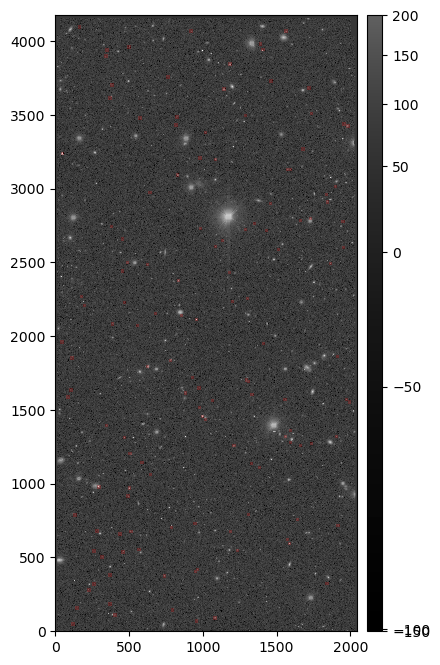

In [85]:
afwDisplay.setDefaultBackend('matplotlib')
fig = plt.figure(figsize=(10, 8))
afw_display = afwDisplay.Display(1)
afw_display.setMaskTransparency(100)
afw_display.setMaskTransparency(80, name="INJECTED")
afw_display.scale('asinh', 'zscale')
afw_display.mtv(injected)

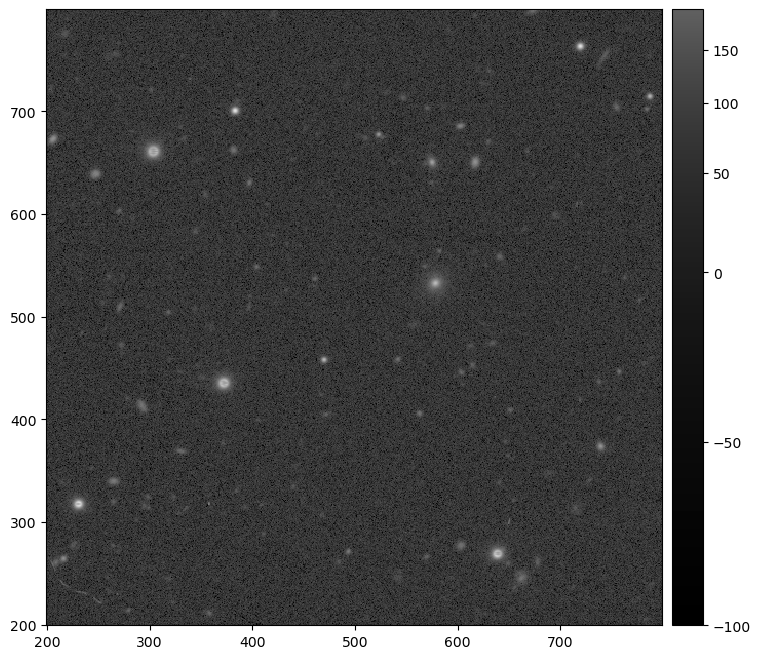

In [100]:
x_center = 500
y_center = 500
half_size = 300

bbox = Box2I(Point2I(x_center-half_size, y_center-half_size),
         Extent2I(2 * half_size, 2 * half_size))
subimage = calexp.Factory(calexp, bbox)


# Set up the display
afwDisplay.setDefaultBackend('matplotlib')
fig = plt.figure(figsize=(10, 8))
afw_display = afwDisplay.Display(1)
afw_display.setMaskTransparency(100)
afw_display.setMaskTransparency(80, name="INJECTED")

#afw_display.setMaskTransparency(100)
afw_display.scale('asinh', 'zscale')
afw_display.mtv(subimage)

on the calexp

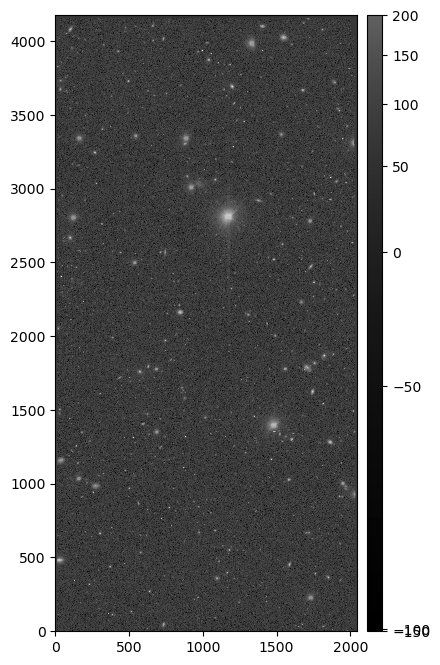

In [83]:
afwDisplay.setDefaultBackend('matplotlib')
fig = plt.figure(figsize=(10, 8))
afw_display = afwDisplay.Display(1)
afw_display.setMaskTransparency(100)
afw_display.setMaskTransparency(10, name="INJECTED")

afw_display.scale('asinh', 'zscale')
afw_display.mtv(calexp)

Same detector different visit 

In [ ]:
ref = {"instrument": 'HSC', "detector": 41, "visit": 1242, "band": 'i', "physical_filter": 'HSC-I', "visit_system": 0}


In [ ]:
injected = butler.get(
    "injected_calexp",
    dataId=ref,
    collections=collection
)

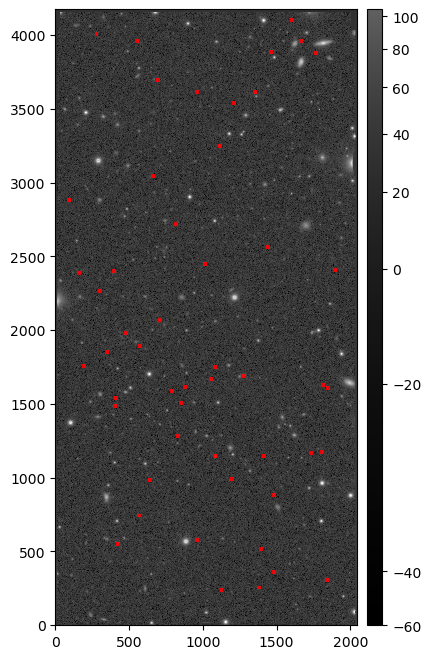

In [77]:
afwDisplay.setDefaultBackend('matplotlib')
fig = plt.figure(figsize=(10, 8))
afw_display = afwDisplay.Display(1)
afw_display.setMaskTransparency(100)
afw_display.setMaskTransparency(10, name="INJECTED")
afw_display.scale('asinh', 'zscale')
afw_display.mtv(injected)


Different detector, same band, plotting 0 injection --> working 

In [44]:
ref = {"instrument": 'HSC', "detector": 47, "visit": 1242, "band": 'i', "physical_filter": 'HSC-I', "visit_system": 0}


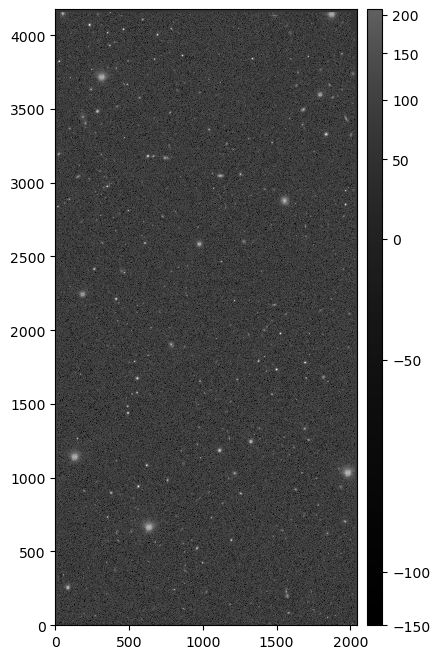

In [47]:
afwDisplay.setDefaultBackend('matplotlib')
fig = plt.figure(figsize=(10, 8))
afw_display = afwDisplay.Display(1)
afw_display.setMaskTransparency(100)
afw_display.setMaskTransparency(10, name="INJECTED")
afw_display.scale('asinh', 'zscale')
afw_display.mtv(injected)


In [64]:
repo = "/sps/lsst/users/rbonnetguerrini/pipelines/rc2_subset/SMALL_HSC/"

# Create a new butler with the collection of interest
collection = 'u/rbonnetguerrini/inject_output_41_single_g'
butler = Butler(repo, collections = collection)
registry = butler.registry

#filter the dataset
datasetRefs = registry.queryDatasets(datasetType='sourceTable',collections=collection)


In [70]:
ref = {"instrument": 'HSC', "detector": 41, "visit": 29350, "band": 'g', "physical_filter": 'HSC-I', "visit_system": 0}


In [71]:
injected = butler.get(
    "injected_calexp",
    dataId=ref,
    collections=collection
)

In [72]:
calexp = butler.get(
    "calexp",
    dataId=ref,
    collections=collection
)

Injection

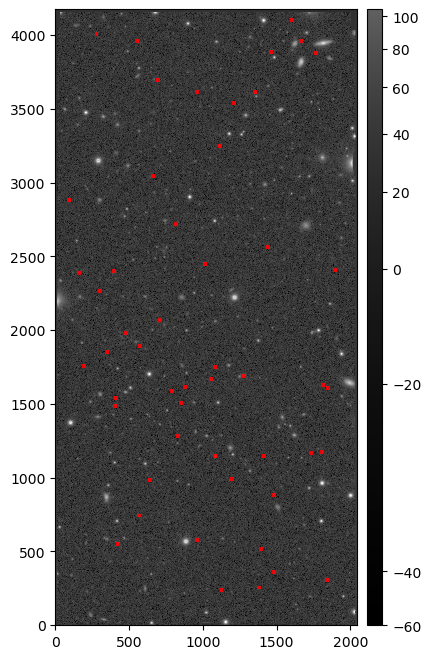

In [73]:
afwDisplay.setDefaultBackend('matplotlib')
fig = plt.figure(figsize=(10, 8))
afw_display = afwDisplay.Display(1)
afw_display.setMaskTransparency(100)
afw_display.setMaskTransparency(10, name="INJECTED")
afw_display.scale('asinh', 'zscale')
afw_display.mtv(injected)

on the calexp

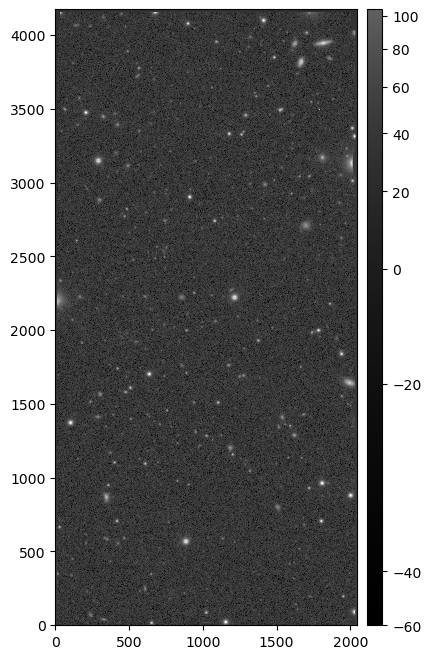

In [74]:
afwDisplay.setDefaultBackend('matplotlib')
fig = plt.figure(figsize=(10, 8))
afw_display = afwDisplay.Display(1)
afw_display.setMaskTransparency(100)
afw_display.setMaskTransparency(10, name="INJECTED")

afw_display.scale('asinh', 'zscale')
afw_display.mtv(calexp)

Same detector different visit 

In [32]:
ref = {"instrument": 'HSC', "detector": 41, "visit": 1242, "band": 'i', "physical_filter": 'HSC-I', "visit_system": 0}


In [33]:
injected = butler.get(
    "injected_calexp",
    dataId=ref,
    collections=collection
)

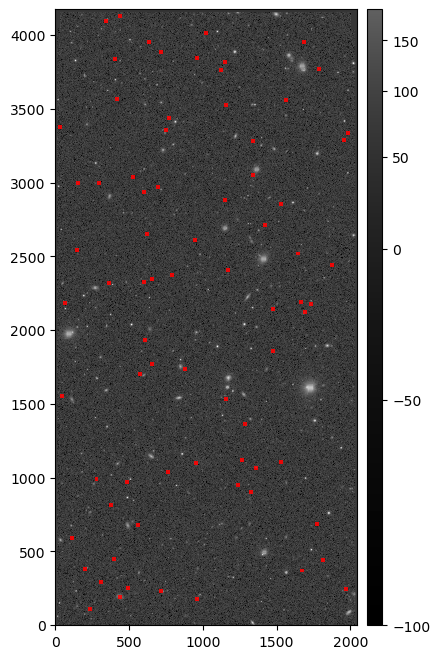

In [34]:
afwDisplay.setDefaultBackend('matplotlib')
fig = plt.figure(figsize=(10, 8))
afw_display = afwDisplay.Display(1)
afw_display.setMaskTransparency(100)
afw_display.setMaskTransparency(10, name="INJECTED")
afw_display.scale('asinh', 'zscale')
afw_display.mtv(injected)


Different detector, same band, plotting 0 injection --> working 

In [44]:
ref = {"instrument": 'HSC', "detector": 47, "visit": 1242, "band": 'i', "physical_filter": 'HSC-I', "visit_system": 0}


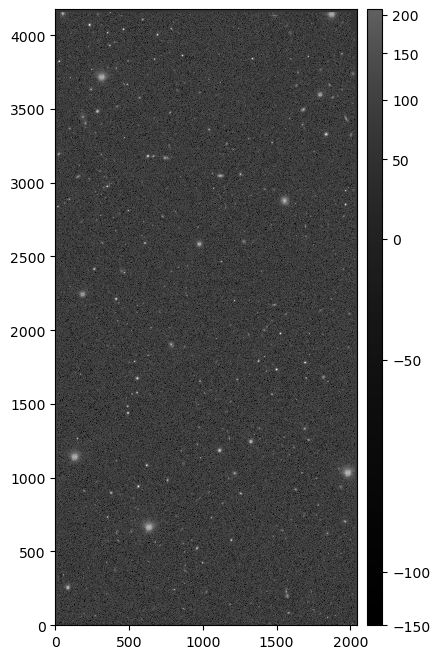

In [47]:
afwDisplay.setDefaultBackend('matplotlib')
fig = plt.figure(figsize=(10, 8))
afw_display = afwDisplay.Display(1)
afw_display.setMaskTransparency(100)
afw_display.setMaskTransparency(10, name="INJECTED")
afw_display.scale('asinh', 'zscale')
afw_display.mtv(injected)


Same detector, differebt band, won't find injected_calexp

## All bandpass single detector 

In [4]:
repo = "/sps/lsst/users/rbonnetguerrini/pipelines/rc2_subset/SMALL_HSC/"

# Create a new butler with the collection of interest
collection = 'u/rbonnetguerrini/inject_output_41_multiband_test'
butler = Butler(repo, collections = collection)
registry = butler.registry

#filter the dataset
datasetRefs = registry.queryDatasets(datasetType='sourceTable',collections=collection)


In [17]:
ref = {"instrument": 'HSC', "detector": 41, "visit": 17906, "band": 'r', "physical_filter": 'HSC-R', "visit_system": 0}


In [18]:
injected = butler.get(
    "injected_calexp",
    dataId=ref,
    collections=collection
)

In [56]:
calexp = butler.get(
    "calexp",
    dataId=ref,
    collections=collection
)

Injection

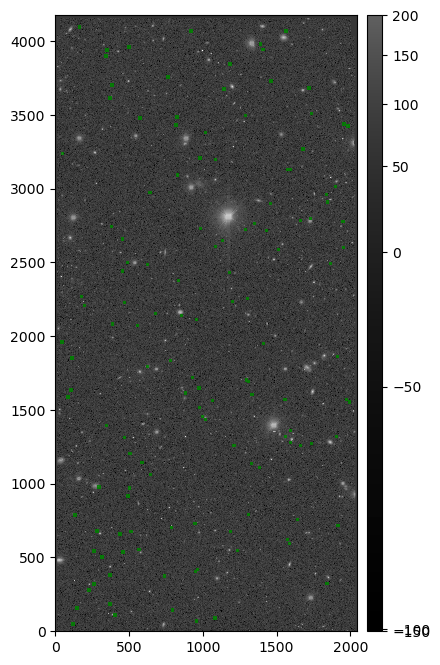

In [ ]:
afwDisplay.setDefaultBackend('matplotlib')
fig = plt.figure(figsize=(10, 8))
afw_display = afwDisplay.Display(1)
afw_display.setMaskTransparency(100)
afw_display.setMaskTransparency(10, name="INJECTED")
afw_display.scale('asinh', 'zscale')
afw_display.mtv(injected)

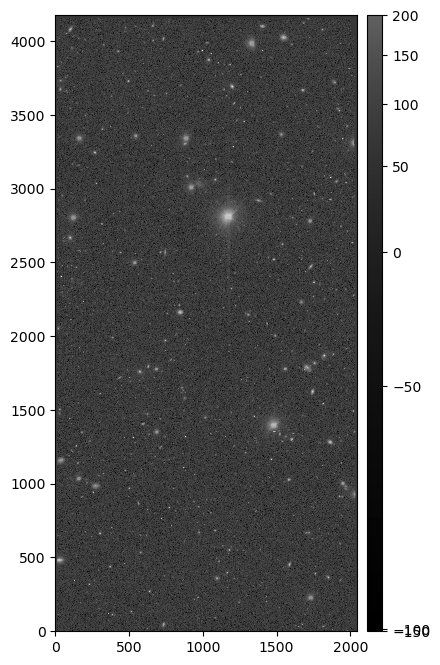

In [81]:
afwDisplay.setDefaultBackend('matplotlib')
fig = plt.figure(figsize=(10, 8))
afw_display = afwDisplay.Display(1)
afw_display.setMaskTransparency(100)
afw_display.setMaskTransparency(10, name="INJECTED")
afw_display.scale('asinh', 'zscale')
afw_display.mtv(calexp)

In [66]:
datasetRefs = registry.queryDatasets('injected_goodSeeingDiff_differenceExp')
for ref in datasetRefs: 
    print(ref)

MissingCollectionError: No collection with name 'u/rbonnetguerrini/injected_step6' found.

In [78]:
repo = "/sps/lsst/users/bsanchez/hsc_processing/pgrc2subset_2/butler.yaml"

In [79]:
collection = 'u/rbonnetguerrini/injected_step6'
butler = Butler(repo,collections=collection)
registry = butler.registry
datasetRefs = registry.queryDatasets('injected_calexp')
for ref in datasetRefs: 
    print(ref)


injected_calexp@{instrument: 'HSC', detector: 49, visit: 358, band: 'y', day_obs: 20140325, physical_filter: 'HSC-Y'} [sc=ExposureF] (run=u/rbonnetguerrini/injected_step3/20240820T152807Z id=21a14bba-9c63-447c-af31-3168d3b694ff)
injected_calexp@{instrument: 'HSC', detector: 41, visit: 29350, band: 'g', day_obs: 20150517, physical_filter: 'HSC-G'} [sc=ExposureF] (run=u/rbonnetguerrini/injected_step3/20240820T152807Z id=4b5a35f4-a040-47eb-8217-4cc46231055d)
injected_calexp@{instrument: 'HSC', detector: 49, visit: 29350, band: 'g', day_obs: 20150517, physical_filter: 'HSC-G'} [sc=ExposureF] (run=u/rbonnetguerrini/injected_step3/20240820T152807Z id=c6232e2c-c319-4a18-ae72-2b54037d6d76)
injected_calexp@{instrument: 'HSC', detector: 50, visit: 29350, band: 'g', day_obs: 20150517, physical_filter: 'HSC-G'} [sc=ExposureF] (run=u/rbonnetguerrini/injected_step3/20240820T152807Z id=b5d82e32-5721-44ae-a224-7b630046d9a9)
injected_calexp@{instrument: 'HSC', detector: 47, visit: 11694, band: 'g', day

In [106]:
ref = {"instrument": 'HSC', "detector": 41, "visit": 19680, "day_obs": 20150121, "band": 'i', "physical_filter": 'HSC-I'}


In [107]:
injected = butler.get(
    "injected_calexp",
    dataId=ref,
    collections=collection
)
temp = butler.get(
    "injected_goodSeeingDiff_templateExp",
    dataId=ref,
    collections=collection
)
diff = butler.get(
    "injected_goodSeeingDiff_differenceExp",
    dataId=ref,
    collections=collection
)

In [22]:
afwDisplay.setDefaultBackend('matplotlib')
fig = plt.figure(figsize=(10, 8))
afw_display = afwDisplay.Display(1)
afw_display.setMaskTransparency(100)
afw_display.setMaskTransparency(10, name="INJECTED")
afw_display.scale('asinh', 'zscale')
afw_display.mtv(injected)

Injection

In [12]:
from lsst.geom import SpherePoint


In [117]:
ra =150.115593
dec =2.193071

In [108]:
ra =150.122384
dec =2.156550

In [113]:
ra =150.235503
dec =2.140136	

In [118]:
wcs = injected.getWcs()

sky_coord = SpherePoint(ra, dec, lsst.geom.degrees)
pixel_coord = wcs.skyToPixel(sky_coord)
x, y = pixel_coord.getX(), pixel_coord.getY()

In [119]:
print(f"Pixel coordinates: x = {x}, y = {y}")


Pixel coordinates: x = 49.73845659608833, y = 3235.9202004820154


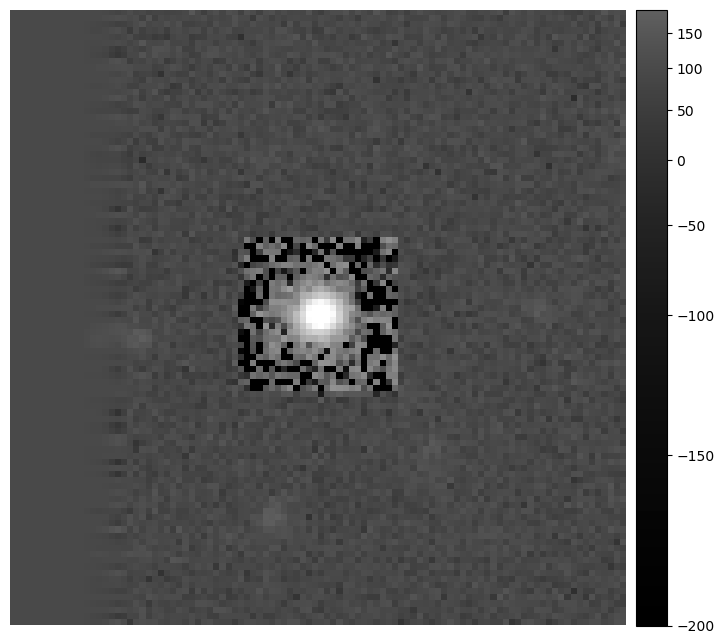

In [121]:
# Define the region of interest (ROI)
x_center = x  # Center x-coordinate
y_center = y  # Center y-coordinate
half_size = 50  # Half-size of the region to be plotted

bbox = Box2I(Point2I(x_center - half_size, y_center - half_size),
             Extent2I(2 * half_size, 2 * half_size))
subimage_injected = injected.Factory(injected, bbox)

# Save the subimage as a FITS file
fits_filename = "weird_noisy_stamps.fits"
subimage_injected.writeFits(fits_filename)

# Set up the display
afwDisplay.setDefaultBackend('matplotlib')
fig = plt.figure(figsize=(10, 8))
afw_display = afwDisplay.Display(1)
afw_display.setMaskTransparency(100)
#afw_display.setMaskPlaneColor("INJECTED", afwDisplay.ORANGE) 
#afw_display.setMaskTransparency(90, name="INJECTED")

afw_display.scale('asinh', 'zscale')
afw_display.mtv(subimage_injected)
plt.axis('off')
plt.show()

In [139]:
subimage_injected.writeFits('weird_noisy_injection.fits')


In [140]:
loaded_exposure = ExposureF('weird_noisy_injection.fits')


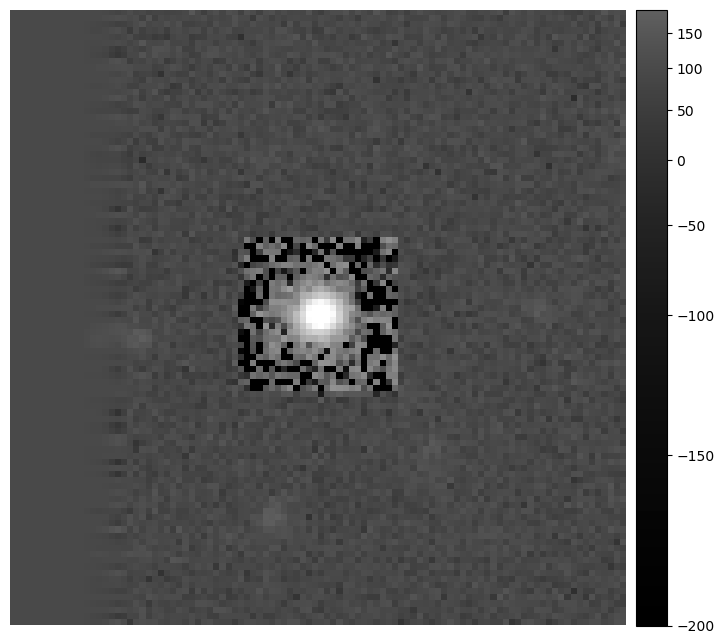

In [141]:
afwDisplay.setDefaultBackend('matplotlib')
fig = plt.figure(figsize=(10, 8))
afw_display = afwDisplay.Display(1)
afw_display.setMaskTransparency(100)
#afw_display.setMaskPlaneColor("INJECTED", afwDisplay.ORANGE) 
#afw_display.setMaskTransparency(90, name="INJECTED")

afw_display.scale('asinh', 'zscale')
afw_display.mtv(loaded_exposure)
plt.axis('off')
plt.show()

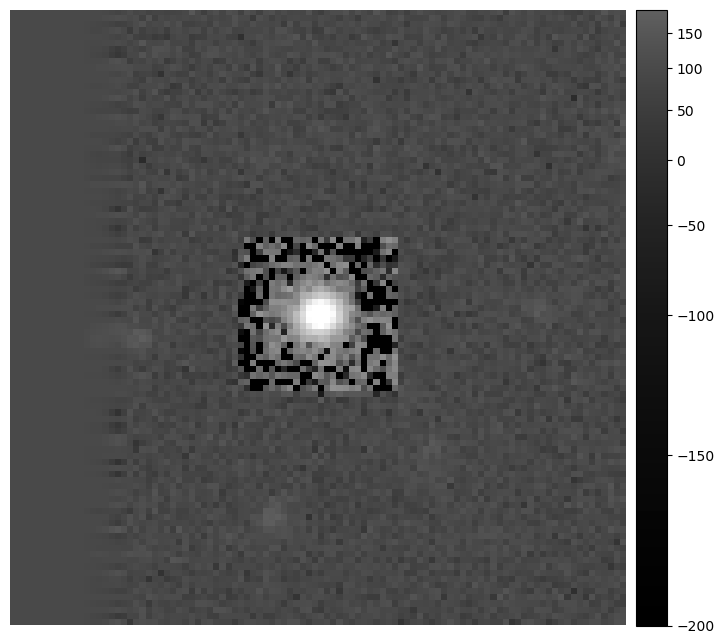

In [ ]:
loaded_exposure
# Set up the display
afwDisplay.setDefaultBackend('matplotlib')
fig = plt.figure(figsize=(10, 8))
afw_display = afwDisplay.Display(1)
afw_display.setMaskTransparency(100)
#afw_display.setMaskPlaneColor("INJECTED", afwDisplay.ORANGE) 
#afw_display.setMaskTransparency(90, name="INJECTED")

afw_display.scale('asinh', 'zscale')
afw_display.mtv(loaded_exposure)
plt.axis('off')
plt.show()

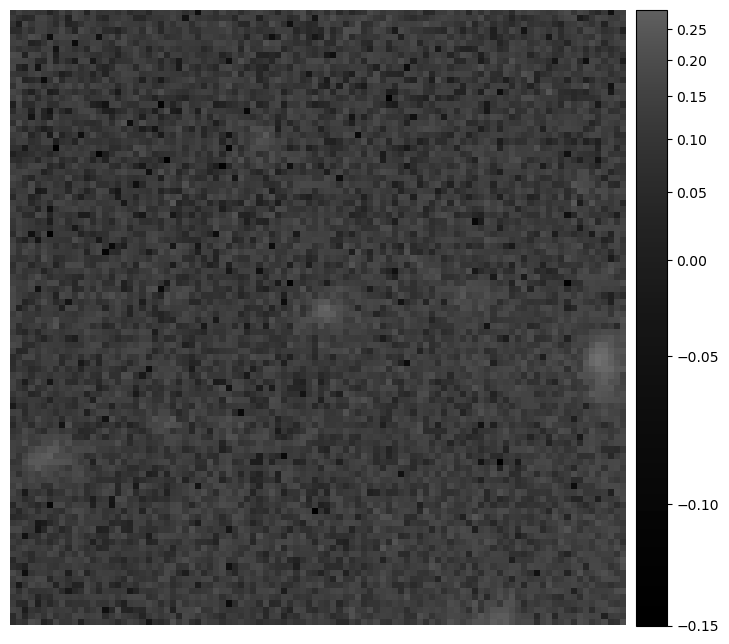

In [112]:
# Define the region of interest (ROI)
x_center = x  # Center x-coordinate
y_center = y  # Center y-coordinate
half_size = 50  # Half-size of the region to be plotted

bbox = Box2I(Point2I(x_center - half_size, y_center - half_size),
             Extent2I(2 * half_size, 2 * half_size))
subimage_injected = injected.Factory(temp, bbox)


# Set up the display
afwDisplay.setDefaultBackend('matplotlib')
fig = plt.figure(figsize=(10, 8))
afw_display = afwDisplay.Display(1)
afw_display.setMaskTransparency(100)
#afw_display.setMaskPlaneColor("INJECTED", afwDisplay.ORANGE) 
#afw_display.setMaskTransparency(90, name="INJECTED")

afw_display.scale('asinh', 'zscale')
afw_display.mtv(subimage_injected)
plt.axis('off')
plt.show()

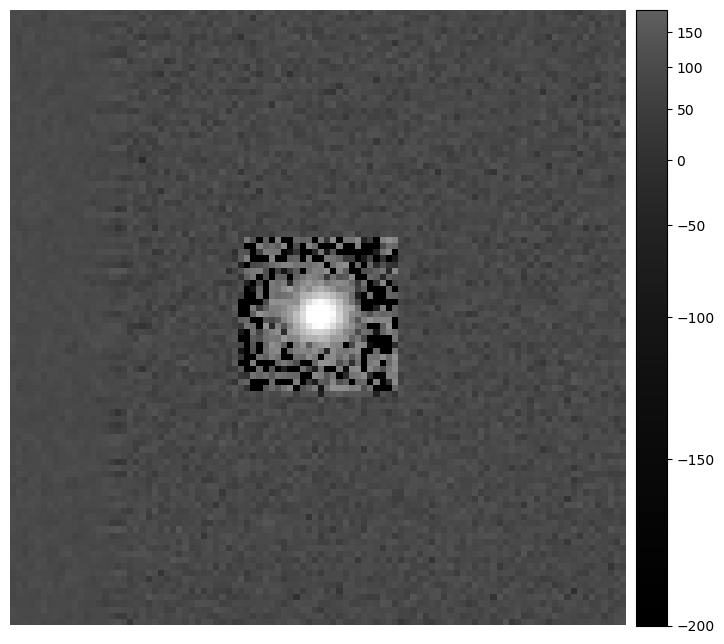

In [101]:
# Define the region of interest (ROI)
x_center = x  # Center x-coordinate
y_center = y  # Center y-coordinate
half_size = 50  # Half-size of the region to be plotted

bbox = Box2I(Point2I(x_center - half_size, y_center - half_size),
             Extent2I(2 * half_size, 2 * half_size))
subimage_injected = injected.Factory(diff, bbox)


# Set up the display
afwDisplay.setDefaultBackend('matplotlib')
fig = plt.figure(figsize=(10, 8))
afw_display = afwDisplay.Display(1)
afw_display.setMaskTransparency(100)
#afw_display.setMaskPlaneColor("INJECTED", afwDisplay.ORANGE) 
#afw_display.setMaskTransparency(90, name="INJECTED")

afw_display.scale('asinh', 'zscale')
afw_display.mtv(subimage_injected)
plt.axis('off')
plt.show()

In [43]:
print('r')

r


In [10]:
plt.savefig('subimage_injected.png', dpi=300, bbox_inches='tight')  # Save as PNG with high resolution


<Figure size 640x480 with 0 Axes>